# Gym Crowdedness Analysis

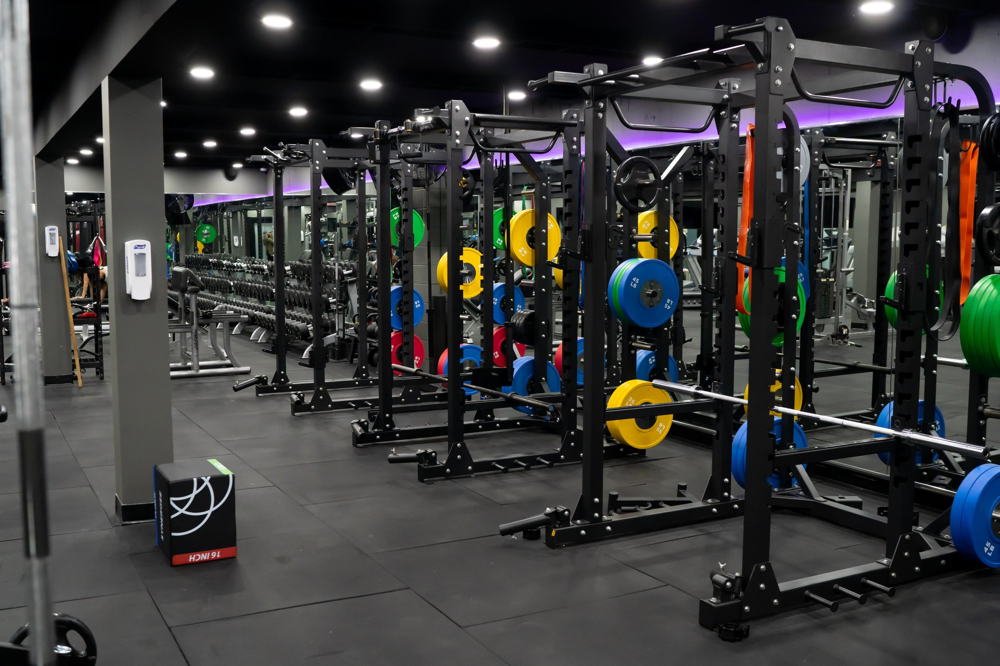

One thing that determines if I have a good workout on any given day is how crowded the gym was when I went. A busy gym can be chaotic and anxiety inducing, and often makes me feel like I'm in people's way. Even worse is the fact that almost every machine I'd want to use on a busy day would be taken, decreasing the effectiveness of my workout. It is therefore essential for me to avoid peak hours at the gym. 

In this analysis, I aim to identify the factors that contribute most to crowdedness at a university gym. My second goal is to build a reliable prediction model to determine whether the gym will be crowded based on various factors, such as the time of day, progression into the semester, and more.

# Table of Contents
* [Data](##data)
* [Data Cleaning](#data_cleaning)
* [Exploratory Data Analysis](#eda)
* [Splitting Data Into Training & Testing](#split)
* [Outlier Detection & Handling](#outlier)
* [Baseline Models](#baseline)
* [Feature Engineering](#feature_eng)
* [Conclusion](#conclusion)

In [116]:
import kagglehub
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import os

from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
import xgboost as xgb
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import ElasticNet
from sklearn.preprocessing import StandardScaler
from sklearn import svm
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import TransformedTargetRegressor

## Data <a id="data"></a>
The dataset consists of 26,000 people counts (about every 10 minutes) taken over the course of one year at a gym located in UC Berkley. The dataset contains information including weather and semester-specific information that might affect how crowded it is.

*Target Variable* : Number of people at the gym

## Features Description:

- *date* : datetime of data

- *timestamp* : number of seconds since beginning of day

- *day_of_week* : 0 (monday) - 6 (sunday)

- *is_weekend* : boolean, with 1 suggesting it is either saturday or sunday, otherwise 0

- *is_holiday* : boolean, with 1 suggesting it is a federal holiday, 0 otherwise

- *temperature* : degrees fahrenheit

- *is_start_of_semester* : boolean, with 1 representing the beginning of a school semester, 0 otherwise

- *month* : 1 (January) - 12 (December)

- *hour* : 0 - 23

In [40]:
# Downloading latest version of data
path = kagglehub.dataset_download("nsrose7224/crowdedness-at-the-campus-gym")
file_path = os.path.join(path, "data.csv")
df = pd.read_csv(file_path, na_values = '-')
df.head()

,number_people,date,timestamp,day_of_week,is_weekend,is_holiday,temperature,is_start_of_semester,is_during_semester,month,hour
0,37,2015-08-14 17:00:11-07:00,61211,4,0,0,71.76,0,0,8,17
1,45,2015-08-14 17:20:14-07:00,62414,4,0,0,71.76,0,0,8,17
2,40,2015-08-14 17:30:15-07:00,63015,4,0,0,71.76,0,0,8,17
3,44,2015-08-14 17:40:16-07:00,63616,4,0,0,71.76,0,0,8,17
4,45,2015-08-14 17:50:17-07:00,64217,4,0,0,71.76,0,0,8,17


In [41]:
df.describe()

,number_people,timestamp,day_of_week,is_weekend,is_holiday,temperature,is_start_of_semester,is_during_semester,month,hour
count,62184.000000,62184.000000,62184.000000,62184.000000,62184.000000,62184.000000,62184.000000,62184.000000,62184.000000,62184.000000
mean,29.072543,45799.437958,2.982504,0.282870,0.002573,58.557108,0.078831,0.660218,7.439824,12.236460
std,22.689026,24211.275891,1.996825,0.450398,0.050660,6.316396,0.269476,0.473639,3.445069,6.717631
min,0.000000,0.000000,0.000000,0.000000,0.000000,38.140000,0.000000,0.000000,1.000000,0.000000
25%,9.000000,26624.000000,1.000000,0.000000,0.000000,55.000000,0.000000,0.000000,5.000000,7.000000
50%,28.000000,46522.500000,3.000000,0.000000,0.000000,58.340000,0.000000,1.000000,8.000000,12.000000
75%,43.000000,66612.000000,5.000000,1.000000,0.000000,62.280000,0.000000,1.000000,10.000000,18.000000
max,145.000000,86399.000000,6.000000,1.000000,1.000000,87.170000,1.000000,1.000000,12.000000,23.000000


In [42]:
print(f"There are {df.shape[0]} rows and {df.shape[1]} columns in this data set.")

There are 62184 rows and 11 columns in this data set.


# Data Cleaning<a id="data_cleaning"></a>

### Column Type Corrections

In [5]:
df.dtypes

number_people             int64
date                     object
timestamp                 int64
day_of_week               int64
is_weekend                int64
is_holiday                int64
temperature             float64
is_start_of_semester      int64
is_during_semester        int64
month                     int64
hour                      int64
dtype: object

In [6]:
cast_to_categorical = ['day_of_week', 'is_weekend', 'is_holiday', 'is_start_of_semester', 'is_during_semester', 'month']

for var in cast_to_categorical:
    df[var] = df[var].astype("category")

df.dtypes

number_people              int64
date                      object
timestamp                  int64
day_of_week             category
is_weekend              category
is_holiday              category
temperature              float64
is_start_of_semester    category
is_during_semester      category
month                   category
hour                       int64
dtype: object

### Checking Categorical Column Values

In [7]:
for col in df.select_dtypes(['category']):
    print(f"Column name : {col} --> {df[col].unique()}")

Column name : day_of_week --> [4, 5, 6, 0, 1, 2, 3]
Categories (7, int64): [0, 1, 2, 3, 4, 5, 6]
Column name : is_weekend --> [0, 1]
Categories (2, int64): [0, 1]
Column name : is_holiday --> [0, 1]
Categories (2, int64): [0, 1]
Column name : is_start_of_semester --> [0, 1]
Categories (2, int64): [0, 1]
Column name : is_during_semester --> [0, 1]
Categories (2, int64): [0, 1]
Column name : month --> [8, 9, 10, 11, 12, ..., 3, 4, 5, 6, 7]
Length: 12
Categories (12, int64): [1, 2, 3, 4, ..., 9, 10, 11, 12]


The output above shows that all of the categories' levels align with the expected values described in the data file. There doesn't seem to be any typos.

### Expanding Date Column

The date column displays the date in the format YYYY-MM-DD, followed by the time in 24 hour clock format. The -7:00 suggests the time is 7 hours behind UTC (Coordinated Universal Time), which is typical for Pacific Daylight Time. This aligns with the data's collection location of UC Berkley, which falls into the Pacific Time Zone. Since there is a lot of potentially useful information contained in the date column, I will split it up into multiple columns in order to make it easier to capture important information easily.

In [8]:
df["minute"] = df["date"].astype("str").apply(lambda x: x.split(" ")[-1].split("-")[0].split(":")[1]).astype(np.int64)
df["progression_into_month"] = df["date"].astype("str").apply(lambda x: x.split(" ")[0].split("-")[-1]).astype(np.int64)
df.drop(columns = ["date"], inplace = True)

df.head()

,number_people,timestamp,day_of_week,is_weekend,is_holiday,temperature,is_start_of_semester,is_during_semester,month,hour,minute,progression_into_month
0,37,61211,4,0,0,71.76,0,0,8,17,0,14
1,45,62414,4,0,0,71.76,0,0,8,17,20,14
2,40,63015,4,0,0,71.76,0,0,8,17,30,14
3,44,63616,4,0,0,71.76,0,0,8,17,40,14
4,45,64217,4,0,0,71.76,0,0,8,17,50,14


In [9]:
df.dtypes

number_people                int64
timestamp                    int64
day_of_week               category
is_weekend                category
is_holiday                category
temperature                float64
is_start_of_semester      category
is_during_semester        category
month                     category
hour                         int64
minute                       int64
progression_into_month       int64
dtype: object

### Missing Values

In [10]:
np.sum(df.isna(), axis = 0)

number_people             0
timestamp                 0
day_of_week               0
is_weekend                0
is_holiday                0
temperature               0
is_start_of_semester      0
is_during_semester        0
month                     0
hour                      0
minute                    0
progression_into_month    0
dtype: int64

As seen above, there are no missing values.

### Categorical Variable Encoding

The "is_weekend", "is_holiday", "is_start_of_semester", and "is_during_semester" columns are encoded with 0/1, representing the boolean False/True values. This label encoding seems appropriate for tree based algorithms, so they will be kept as is. For other algorithms such as linear regression, they will need to be one-hot-encoded.

The "day_of_week" and "month" columns are currently label-encoded to represent the day of the week (e.g., 0 = Monday) and the month (e.g., 1 = January). For tree-based models, this encoding works because they do not assume linear relationships between feature values. However, it’s worth noting that these features are cyclical (e.g., Sunday is next to Monday, and December is next to January). If these columns are used in non-tree-based models, transformations like one-hot encoding may be more appropriate to capture the cyclical nature. For now, they will be kept unchanged and evaluated during modeling.

# Exploratory Data Analysis

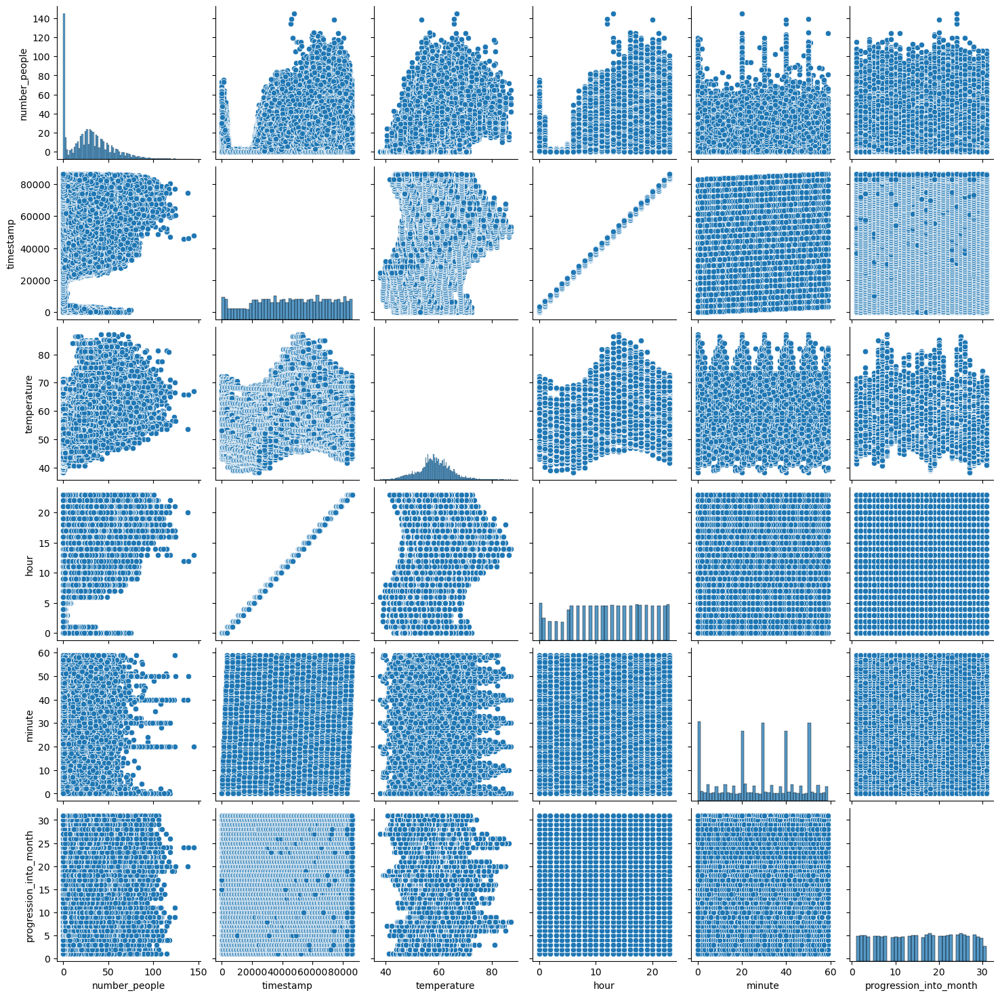

In [11]:
sns.pairplot(df)
plt.show()

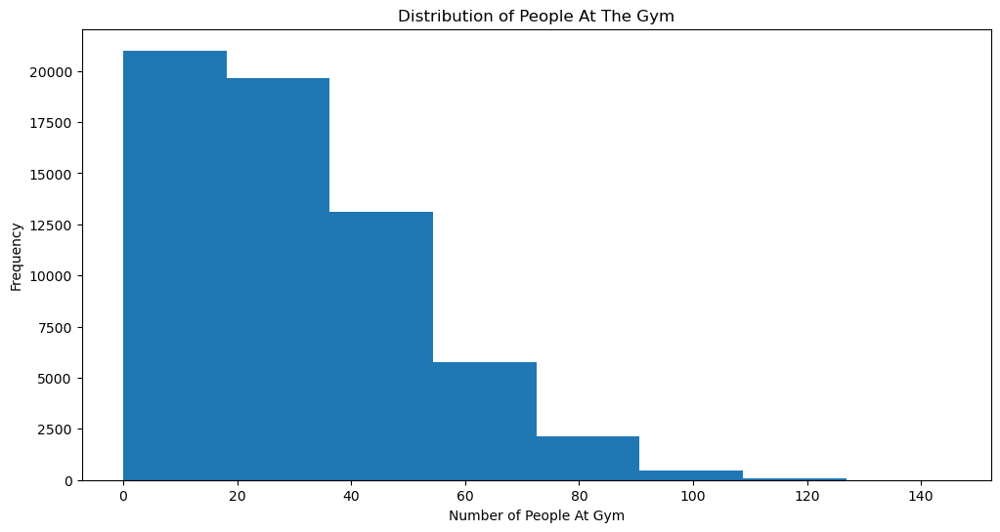

In [122]:
plt.figure(figsize=(12, 6)) 
plt.hist(df.number_people, bins = 8)
plt.xlabel("Number of People At Gym")
plt.ylabel("Frequency")
plt.title("Distribution of People At The Gym")
plt.show()

As seen above, the most common number of people at the gym is between 0-20. There is a right skewness, suggesting instances of some extremely large but uncommon number of people. 

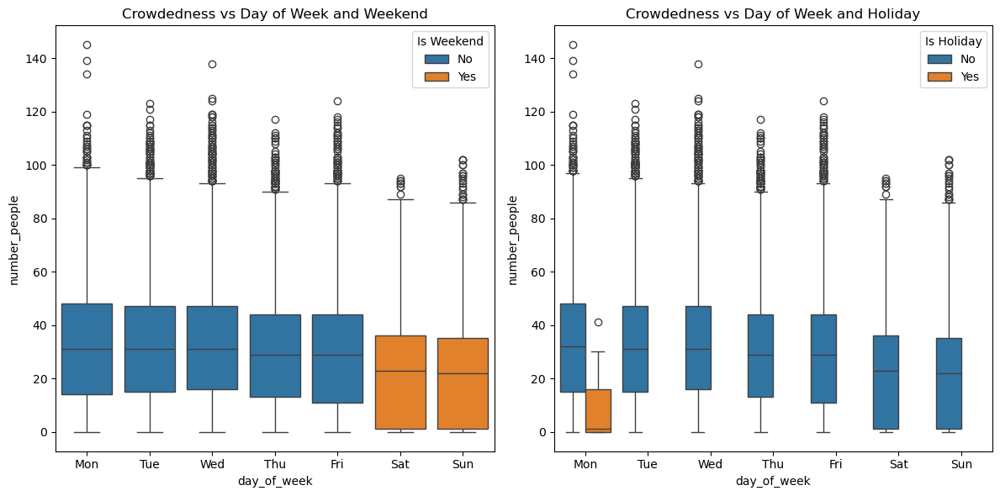

In [13]:
fig, ax = plt.subplots(1,2, figsize=(12, 6))

# Plot using sns.boxplot
sns.boxplot(data=df, y='number_people', x='day_of_week', hue='is_weekend', ax=ax[0])
ax[0].set_title("Crowdedness vs Day of Week and Weekend")
ax[0].set_xticks(range(7), labels = ["Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun"])
handles, labels = ax[0].get_legend_handles_labels()
ax[0].legend(handles = handles, labels = ["No", "Yes"], title = "Is Weekend")

sns.boxplot(data=df, y='number_people', x='day_of_week', hue='is_holiday', ax=ax[1])
ax[1].set_title("Crowdedness vs Day of Week and Holiday")
ax[1].set_xticks(range(7), labels = ["Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun"])

handles, labels = ax[1].get_legend_handles_labels()
ax[1].legend(handles = handles, labels = ["No", "Yes"], title = "Is Holiday")

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

The left plot shows that the overlap between the blue boxes is high, suggesting that there **is not a significant relationship between the different weekdays** and the number of people at the gym. However, the orange colored boxes have noticably less overlap and lower medians than the blue boxes, indicating that **there may be a relationship between weekends and number of people at the gym**. Specifically, the weekends see less people in the gym. This makes sense if we consider that this is data from a university gym. Students may prefer to catch up with their school work during the weekends rather than workout, for instance.

The right plot shows that all holidays fell on a Monday. There were less people at the gym during holidays as seen by the low median and virtually no overlap between the orange and blue boxes on Monday. **We should therefore expect to see some relationship between holiday and number of people.**

The extra points above the boxplot as suggests the presence of some outliers.

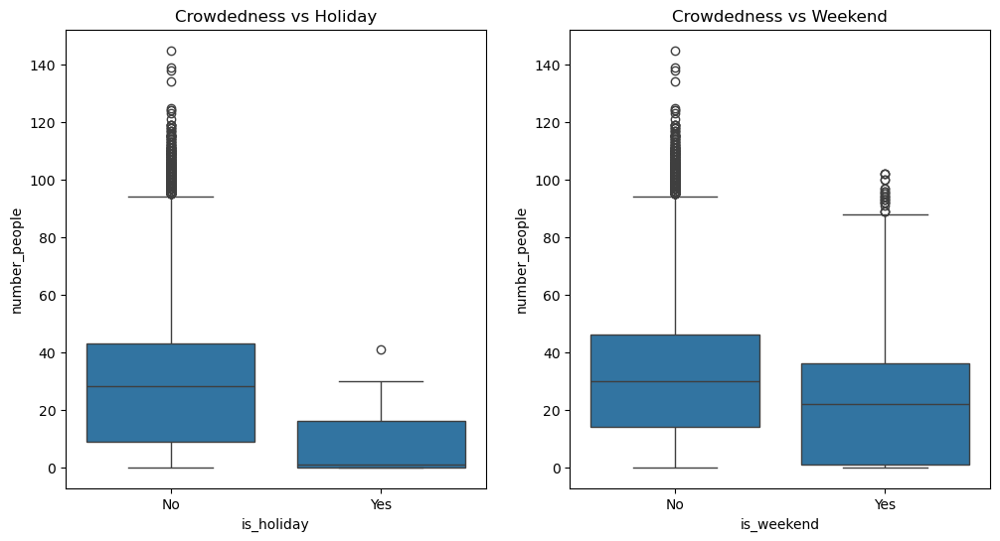

In [14]:
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

sns.boxplot(data = df, x = 'is_holiday', y = 'number_people', ax = ax[0])
ax[0].set_title("Crowdedness vs Holiday")
ax[0].set_xticks(ticks = range(2), labels = ["No", "Yes"])

sns.boxplot(data = df, x = 'is_weekend', y = 'number_people', ax = ax[1])
ax[1].set_title("Crowdedness vs Weekend")
ax[1].set_xticks(ticks = range(2), labels = ["No", "Yes"])
plt.show()

Plotting these graphs by themselves confirms **there appears to be a visual relationship between holiday and crowdedness**. The boxes have little overlap and the medians are vastly different (around 35 people for no holiday and 5 for holidays). 

The right graph shows the weekend and weekday medians are different by about 10 people, which is still noticeable albeat not as much as the left graph's difference. There is overlap between the boxes. We might need to investigate the relationship between weekend and crowdedness through modelling, as the visualization is inconclusive. The overlapping is not insignificant.  

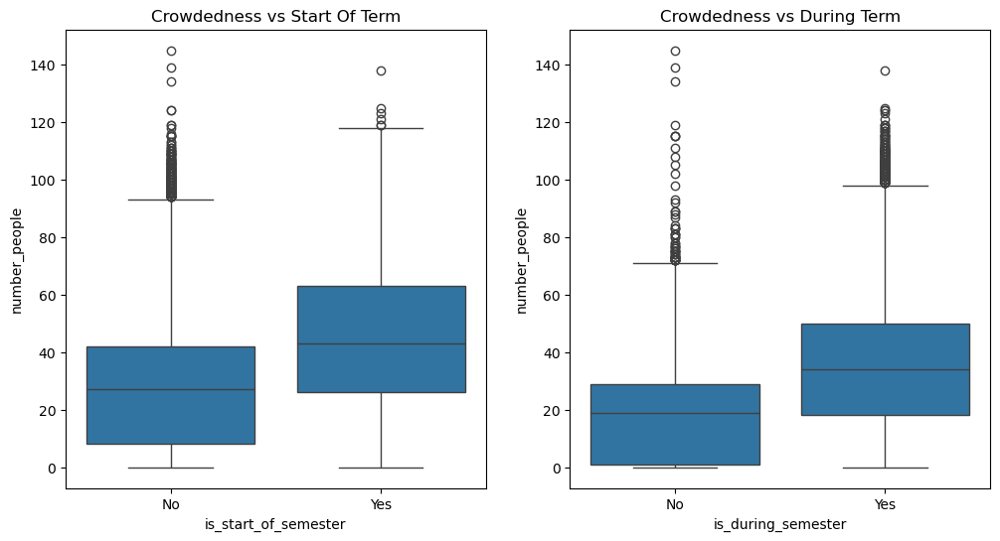

In [15]:
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

sns.boxplot(data = df, x = 'is_start_of_semester', y = 'number_people', ax = ax[0])
ax[0].set_title("Crowdedness vs Start Of Term")
ax[0].set_xticks(ticks = range(2), labels = ["No", "Yes"])

sns.boxplot(data = df, x = 'is_during_semester', y = 'number_people', ax = ax[1])
ax[1].set_title("Crowdedness vs During Term")
ax[1].set_xticks(ticks = range(2), labels = ["No", "Yes"])

plt.show()

It can be observed in the left plot that at the start of the term, there is more crowdedness. There appears to be a **relationship between crowdedness and the start of the term** as suggested by the small overlapping and significantly different medians between the two boxes. 

Similar to the left plot, the right plot depicts only a small overlap between non-semester and semester boxes along with significantly different medians, suggesting the possibility of a relationship between crowdedness and semester. In particular, there appears to be a **positive relationship between crowdedness and whether or not there is currently an ongoing semester.** The gym is more crowded during the semester.

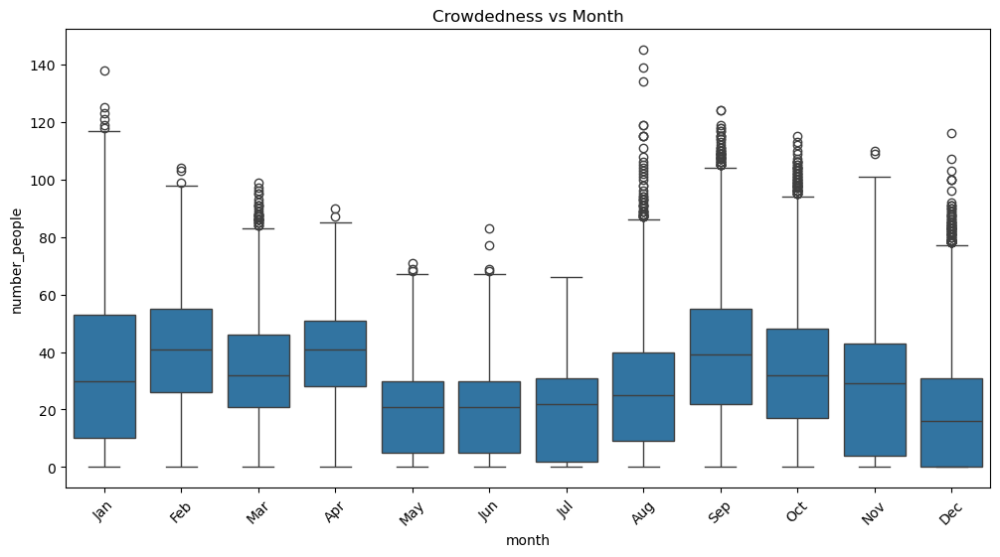

In [16]:
month_names = {1: 'Jan', 2: 'Feb', 3: 'Mar', 4: 'Apr', 5: 'May', 6: 'Jun',
               7: 'Jul', 8: 'Aug', 9: 'Sep', 10: 'Oct', 11: 'Nov', 12: 'Dec'}

plt.figure(figsize = (12,6))
sns.boxplot(data = df, x = 'month', y = 'number_people')
plt.title("Crowdedness vs Month")
plt.xticks(ticks=range(12), labels=[month_names[m] for m in range(1, 13)], rotation=45)
plt.show()

This plot of crowdedness by month clearly shows that some boxes like April and May have almost no overlap. This specific case makes sense because as seen in the spring 2016 academic calendar from UC Berkley attached below, spring classes end early May. The majority of May consisted of final examinations and break. This is usually a time students leave for summer break, or during the finals season, focus on studying. The drop in crowdedness between April and May is therefore understandable. This suggests that we can **expect to see a relationship between month and crowdedness.** Moreover, it might be worthwhile to **consider an interaction term between the point in semester the students are and the month.**


| 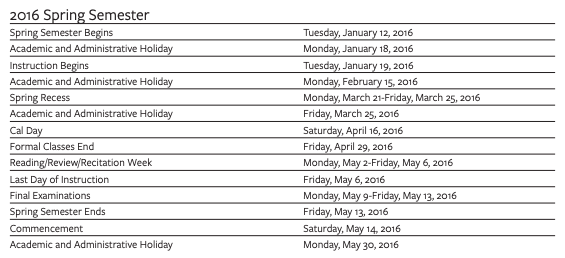 | 
|:--:| 
| *Spring 2016 UC Berkley Academic Calendar* |


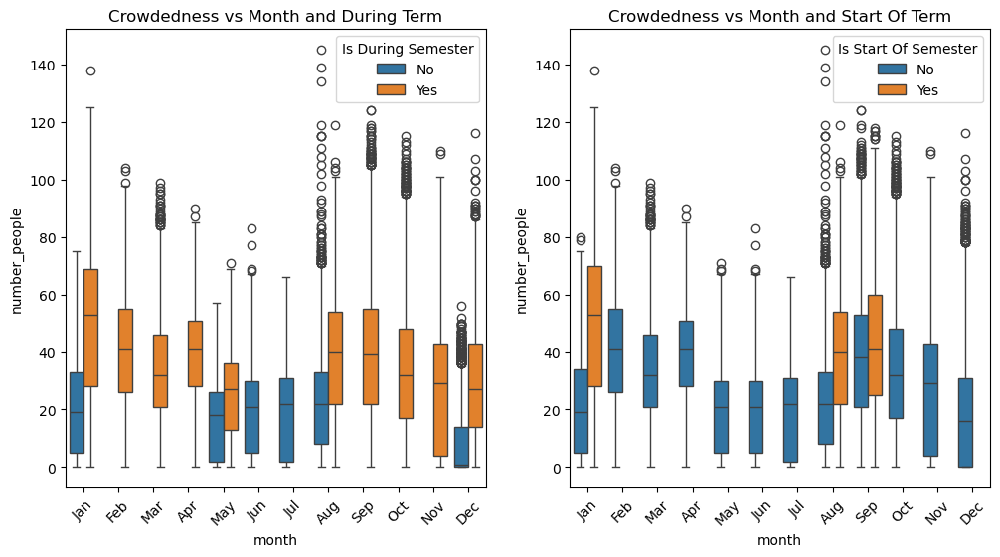

In [17]:
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

sns.boxplot(data = df, x = 'month', y = 'number_people', hue = 'is_during_semester', ax=ax[0])
ax[0].set_xticks(ticks = range(12), labels = [month_names[m] for m in range(1, 13)], rotation = 45)
ax[0].set_title("Crowdedness vs Month and During Term")
handles, labels = ax[0].get_legend_handles_labels()  
ax[0].legend(handles=handles, labels=["No", "Yes"], title="Is During Semester") 

sns.boxplot(data = df, x = 'month', y = 'number_people', hue = 'is_start_of_semester', ax=ax[1])
ax[1].set_title("Crowdedness vs Month and Start Of Term")
ax[1].set_xticks(ticks = range(12), labels = [month_names[m] for m in range(1, 13)], rotation = 45)
handles, labels = ax[1].get_legend_handles_labels()  
ax[1].legend(handles=handles, labels=["No", "Yes"], title="Is Start Of Semester") 
plt.show()

As seen in left plot, for the same month, there were more people in the gym on any given day after the term had started. This makes sense as during non-semester days, most students would not be on campus, rendering the campus gym uncrowded. **There also appears to be a relationship between crowdedness and the interaction of "month" and "during semester".** 

The right plot shows there are three starts of terms (three terms) at UC Berkley. However, this is not entirely accurate; there are two main semesters in UC Berkley. According to the 2015-2016 UCB academic calendar, the fall term began on August 26. As this is almost the end of August, the creator of the dataset had decided to include some portion of September as part of the "start" of semester. The plot suggests that at the start of the term, there are more people in the gym.

From the graphs above, we can also observe a general pattern of decreasing crowdedness as the semester progresses. The highest number of people at the gym were generally at the start of the semester.

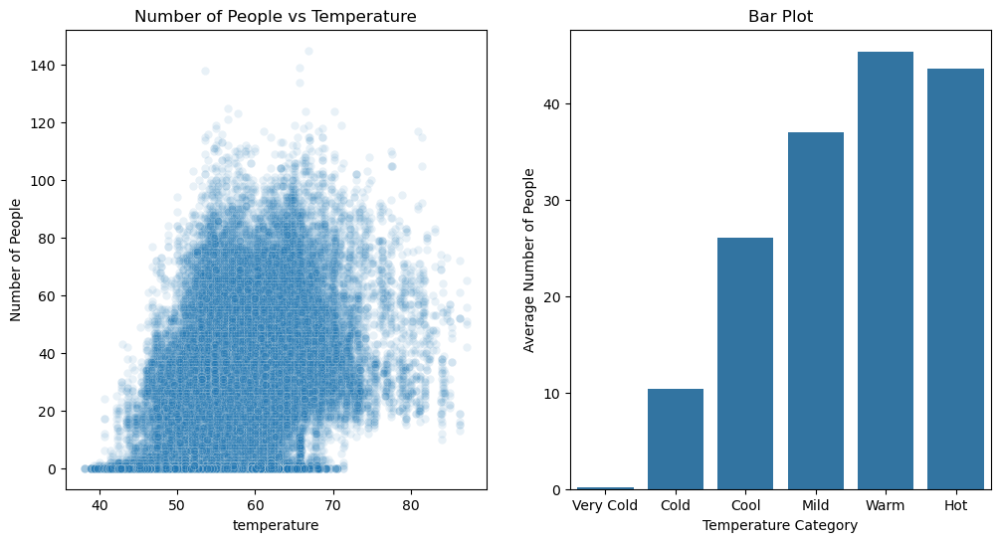

In [18]:
fig, ax = plt.subplots(1,2, figsize = (12,6))
sns.scatterplot(x = df["temperature"], y = df["number_people"], alpha = 0.1, ax = ax[0])
ax[0].set_title("Number of People vs Temperature")
ax[0].set_ylabel("Number of People")
ax[0].set_label("Temperature")

bins = [30, 40, 50, 60, 70, 80, 100]
labels = ["Very Cold", "Cold", "Cool", "Mild", "Warm", "Hot"]

sns.barplot(
    data=df.assign(temp_category=pd.cut(df['temperature'], bins=bins, labels=labels)), 
    x="temp_category", 
    y="number_people", 
    estimator=np.mean, 
    errorbar=None,
    ax = ax[1]
)
ax[1].set_title("Bar Plot")
ax[1].set_xlabel("Temperature Category")
ax[1].set_ylabel("Average Number of People")

plt.show()

| 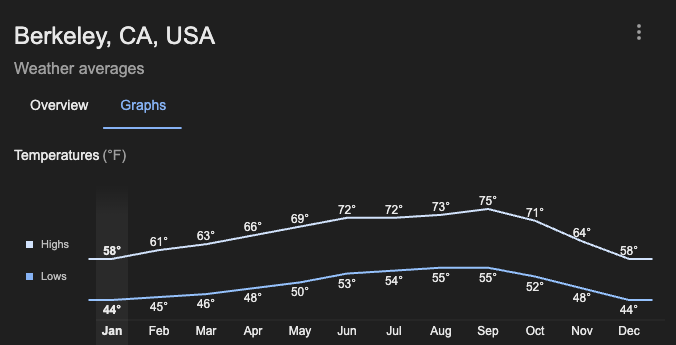 |
|:--:|
| *30–40: "Very Cold"* |
| *40–50: "Cold"* |
| *50–60: "Cool"* |
| *60–70: "Mild"* |
| *70–80: "Warm"* |
| *80–100: "Hot"* |

The above screenshot from Google shows the average temperatures in Berkley, CA year round. We can see it is usually in the "cold" to "warm" range year round. The most common temperatures are "mild" and "warm". 

The graphs show that the campus gym is most crowded on warm days, followed by hot days and mild days. This aligns with the general climate of Berkeley, where temperatures typically range from mild to warm. Cold days see significantly lower gym attendance, which is expected given Berkeley's milder climate.

The scatter plot suggests that there might be a relationship between temperature and the number of people, but it isn't strongly linear. There could be other influencing factors or a non-linear relationship at play.  

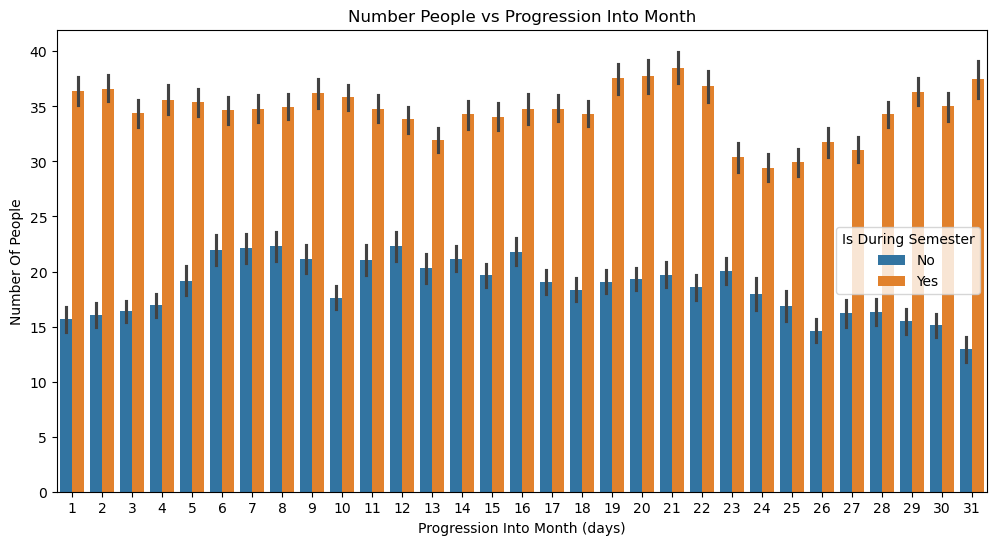

In [19]:
plt.figure(figsize = (12, 6))
barplot = sns.barplot(df, x = "progression_into_month", y = "number_people", hue = "is_during_semester")
plt.xlabel("Progression Into Month (days)")
plt.ylabel("Number Of People")
plt.title("Number People vs Progression Into Month")
handles, labels = barplot.get_legend_handles_labels()
plt.legend(handles=handles, labels=["No", "Yes"], title="Is During Semester")
plt.show()

The graph suggests that there is a significant interaction between 'Is During Semester' and 'Progression into Month.' While the number of people at the gym appears to vary slightly throughout the month during non-semester periods, there is a more pronounced pattern during the semester. Specifically, there is a noticeable drop in gym attendance between the 23rd and 27th of the month during the semester. This interaction warrants further investigation and could be an important factor to consider during modelling.

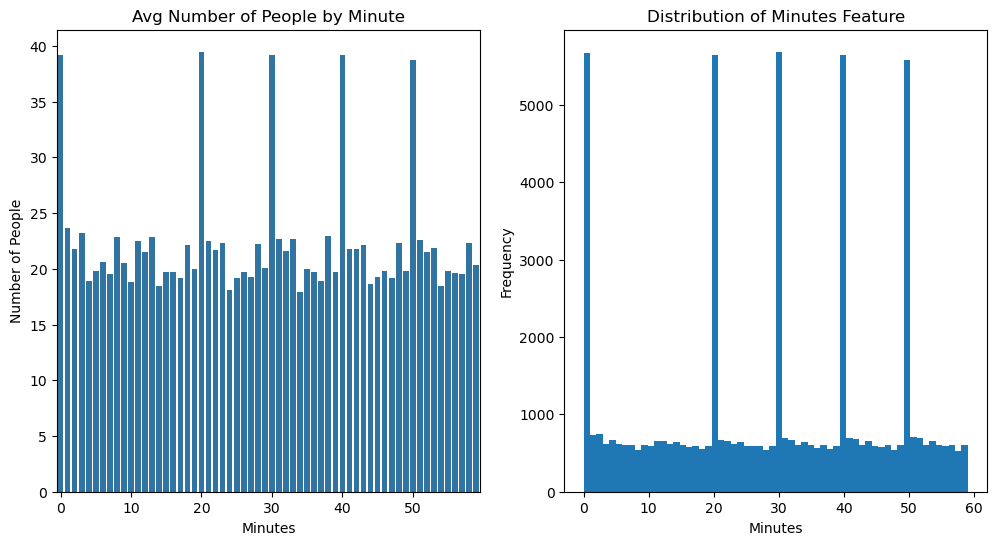

In [20]:
fig, ax = plt.subplots(1,2, figsize = (12,6))

sns.barplot(data=df, x="minute", y="number_people", estimator=np.mean, errorbar=None, ax = ax[0])
ax[0].set_title("Avg Number of People by Minute")
ax[0].set_xlabel("Minutes")
ax[0].set_ylabel("Number of People")
ax[0].set_xticks(ticks=range(0, 60, 10))

ax[1].hist(df['minute'], bins = 60)
ax[1].set_title("Distribution of Minutes Feature")
ax[1].set_xlabel("Minutes")
ax[1].set_ylabel("Frequency")
plt.show()

The plots above highlight an important observation about the "minutes" feature. Peaks occur at specific times, such as 0, 20, 30, 40, and 50 minutes, which align with the intervals at which data was collected (i.e. approximately every 10 minutes). While this pattern suggests that the method of data collection contributes to the observed peaks, it does not necessarily mean that the values recorded in between these intervals are invalid. This column might still be useful. 

A histogram shows the most common values of a feature in the dataset. While the most commonly recorded values are on whole numbers (e.g., 0, 20, etc.), it does not inherently invalidate the mean response values of the less frequently recorded "in-between" values. A smaller sample size for those averages simply implies that they may be less reliable and should be treated cautiously.

Given this, the "minutes" feature will be retained for now, but with caution. Its contribution to the model will be evaluated during the modeling process to determine whether it provides meaningful insights or introduces noise. If the feature is found to be unhelpful or misleading, it will be excluded to ensure the model's accuracy and interpretability.

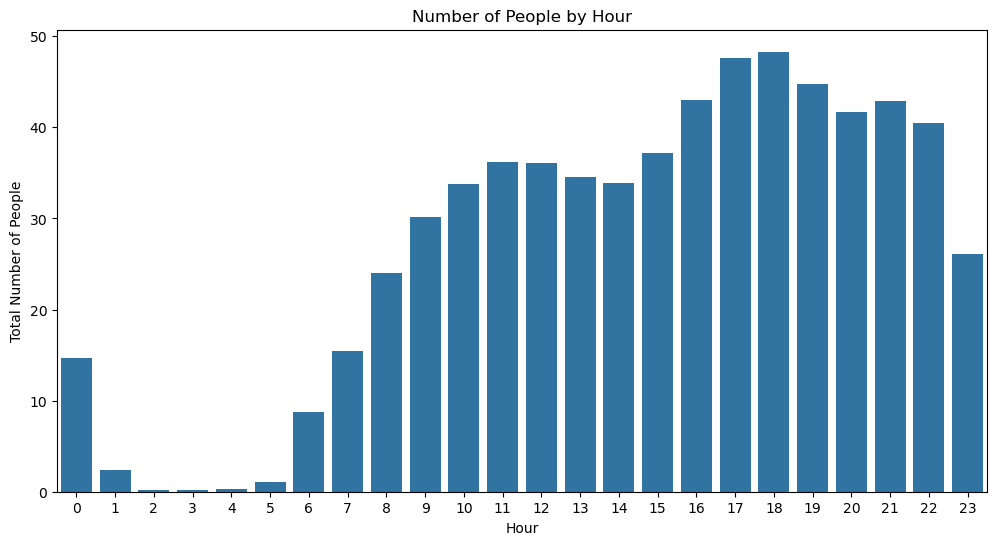

In [21]:
plt.figure(figsize = (12, 6))
sns.barplot(data=df, x="hour", y="number_people", errorbar=None)
plt.title("Number of People by Hour")
plt.xlabel("Hour")
plt.ylabel("Total Number of People")
plt.show()

This graph shows that the busiest time at the campus gym was between 17:00 and 18:00 in military time, or 5-6 p.m. in standard time. This is intuitive and a common pattern seen in most gyms. It is interesting to observe that there are still people in the gym at midnight, however. Most people begin to arrive in the gym at 6 a.m. in the morning. Additionallly, the gym is busier later in the day. This might be because most lectures occur earlier in the day. 

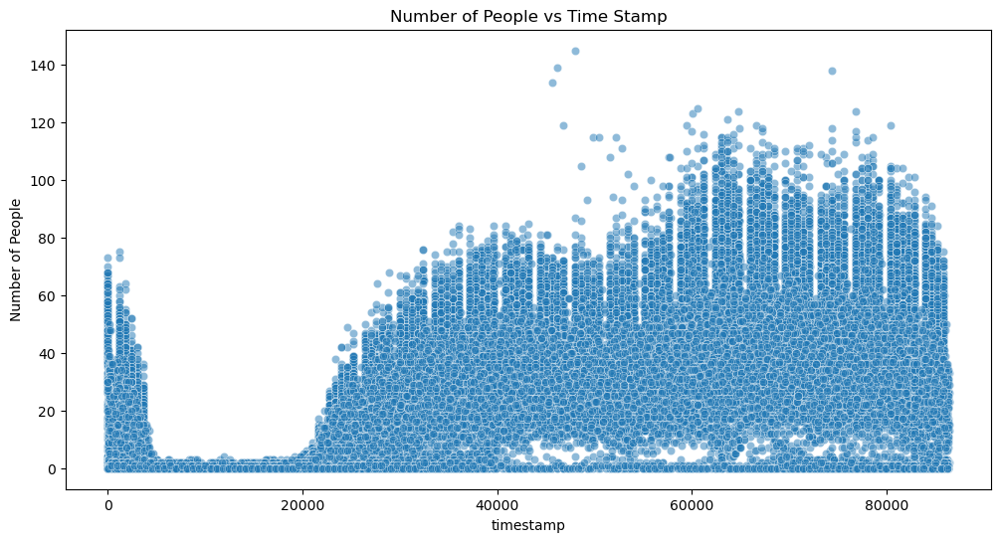

In [22]:
plt.figure(figsize = (12,6))
sns.scatterplot(x = df["timestamp"], y = df["number_people"], alpha = 0.5)
plt.title("Number of People vs Time Stamp")
plt.ylabel("Number of People")
plt.show()

The graph above shows a similar pattern/overall shape to the "hours" bar graph. Since it seems to describe essentially the same information as above, we may have to remove one feature in order to prevent multicollinearity from affecting model performance negatively.

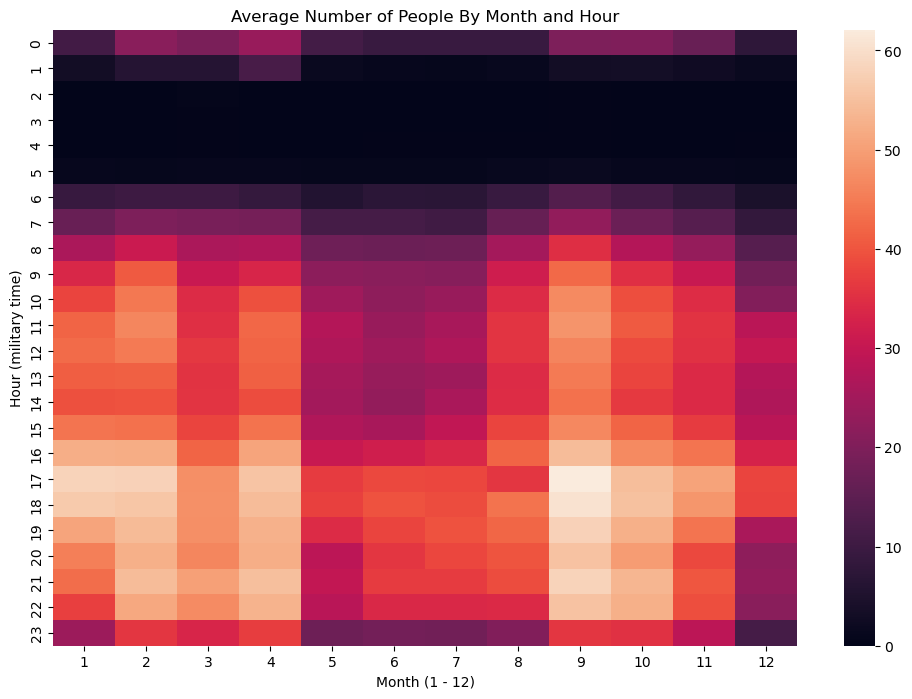

In [23]:
heatmap_data = df.groupby(by = ["month", "hour"], observed = True)["number_people"].mean().reset_index()
heatmap_data = heatmap_data.pivot(index = "hour", columns = "month", values =  "number_people").fillna(0)

plt.figure(figsize = (12,8))
sns.heatmap(heatmap_data)
plt.title("Average Number of People By Month and Hour")
plt.xlabel("Month (1 - 12)")
plt.ylabel("Hour (military time)")
plt.show()

The heatmap above shows that the average number of people in the gym are close 0 in the early hours of the day (midnight to 5 a.m.). More people are in the gym between the months of January - April and September to December (which represent the spring and fall semesters at UC Berkley). The most busy time in the gym is in September at 17:00 or 5 p.m. The best time to go to the gym during the semester appears to be at 6 a.m., as it is not too early and usually has less than 20 people on an average day. 

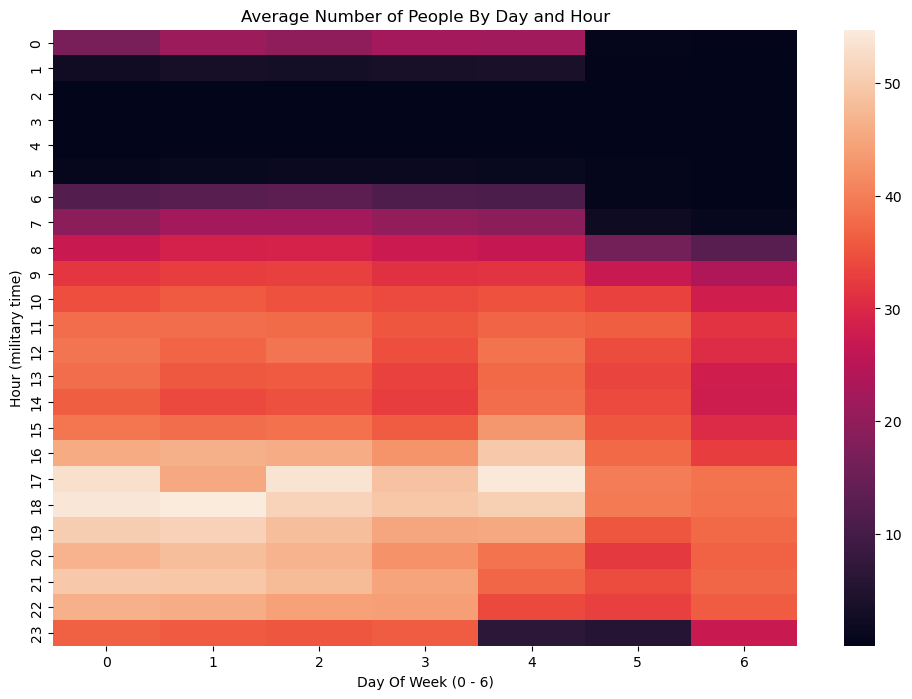

In [24]:
heatmap_data = df.groupby(by = ["day_of_week", "hour"], observed = True)["number_people"].mean().reset_index()
heatmap_data = heatmap_data.pivot(index = "hour", columns = "day_of_week", values = "number_people")
heatmap_data.head()

plt.figure(figsize = (12, 8))
sns.heatmap(heatmap_data)
plt.title("Average Number of People By Day and Hour")
plt.xlabel("Day Of Week (0 - 6)")
plt.ylabel("Hour (military time)")
plt.show()

The heatmap above shows that Saturday and Sunday have more quiet gym hours that the weekdays. While the weekdays usually have close to 0 people in the gym between 1 a.m. and 5 a.m., the weekends are pretty empty between midnight and 7 a.m. This suggests that to avoid the crowds, going to the gym at 7 a.m. on Saturdays and Sundays is ideal. The most crowded times are between 5 - 6 p.m. on weekdays, especially Mondays, Wednesdays, and Fridays.

## Splitting Data Into Training & Testing

In [25]:
X = df.copy()
y = X.pop("number_people")

In [26]:
X.head()

,timestamp,day_of_week,is_weekend,is_holiday,temperature,is_start_of_semester,is_during_semester,month,hour,minute,progression_into_month
0,61211,4,0,0,71.76,0,0,8,17,0,14
1,62414,4,0,0,71.76,0,0,8,17,20,14
2,63015,4,0,0,71.76,0,0,8,17,30,14
3,63616,4,0,0,71.76,0,0,8,17,40,14
4,64217,4,0,0,71.76,0,0,8,17,50,14


In [27]:
y.head()

0    37
1    45
2    40
3    44
4    45
Name: number_people, dtype: int64

In [38]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.8, random_state = 42)

## Outlier Detection And Handling

In [49]:
from sklearn.ensemble import IsolationForest
anomaly_inputs = X_train.copy()
model = IsolationForest(contamination=0.05, random_state=42)
model.fit(anomaly_inputs)
X_train["anomoly_scores"] = model.decision_function(anomaly_inputs)
X_train["anomaly"] = model.predict(anomaly_inputs)

X_train.head()

,timestamp,day_of_week,is_weekend,is_holiday,temperature,is_start_of_semester,is_during_semester,month,hour,minute,progression_into_month,anomoly_scores,anomaly
35235,78443,2,0,0,61.39,0,0,7,21,47,13,0.117613,1
21476,81615,0,0,0,55.51,0,1,3,22,40,21,0.111587,1
24103,52817,1,0,0,69.45,0,1,4,14,40,19,0.139305,1
23300,53418,5,1,0,58.78,0,1,4,14,50,9,0.105377,1
43598,31850,6,1,0,56.70,0,1,9,8,50,11,0.094924,1


<Figure size 1200x600 with 0 Axes>

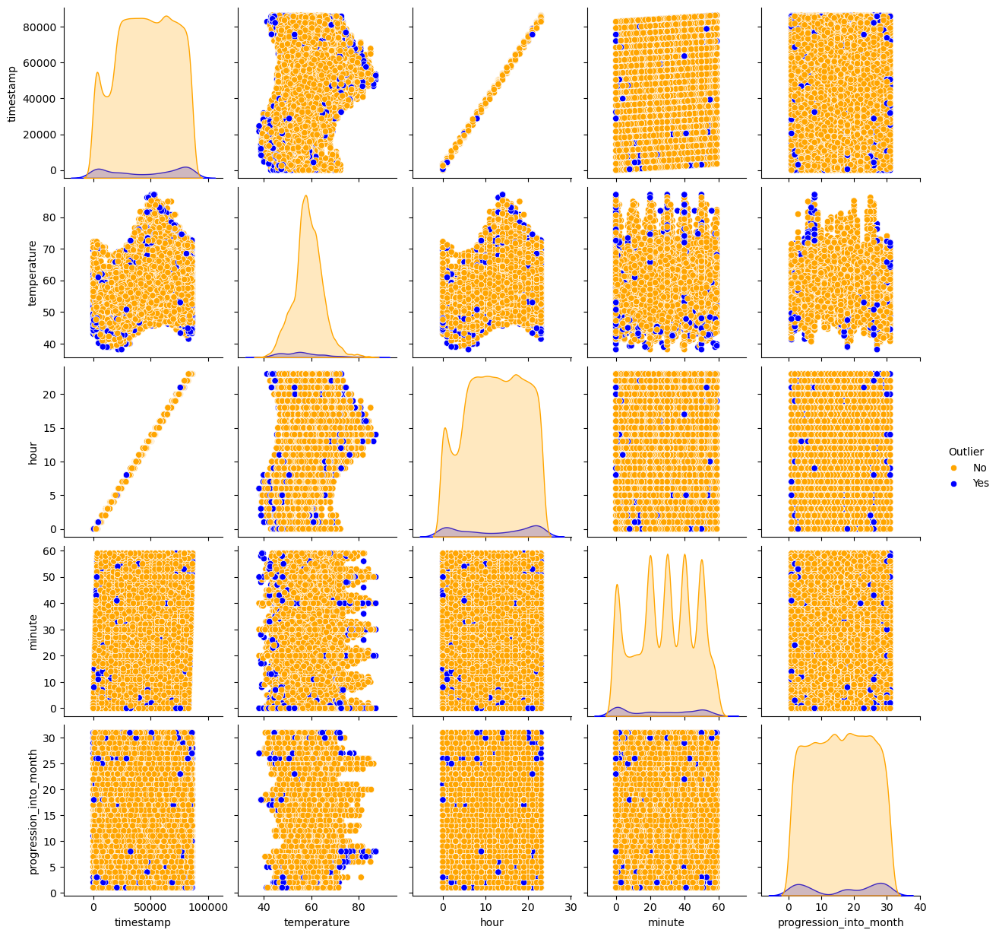

In [61]:
# Visualizing outliers in numerical features
plt.figure(figsize = (12, 6))
palette = ["orange", "blue"]
outlier_data = X_train.copy()
outlier_data["Outlier"] = outlier_data["anomaly"].map({-1 : "Yes", 1 : "No"})
sns.pairplot(outlier_data, vars = ["timestamp", "temperature", "hour", "minute", "progression_into_month"], hue = "Outlier", palette = palette)
plt.show()

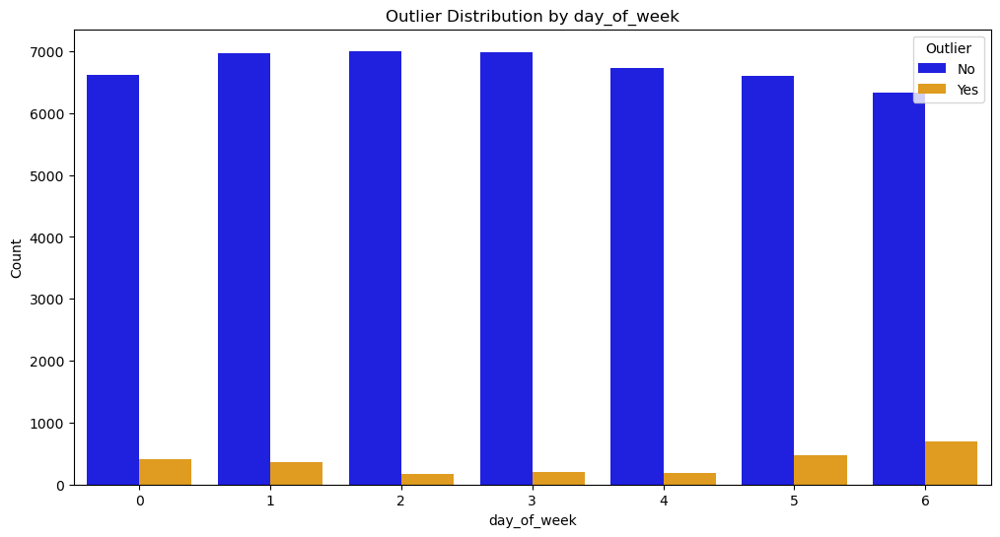

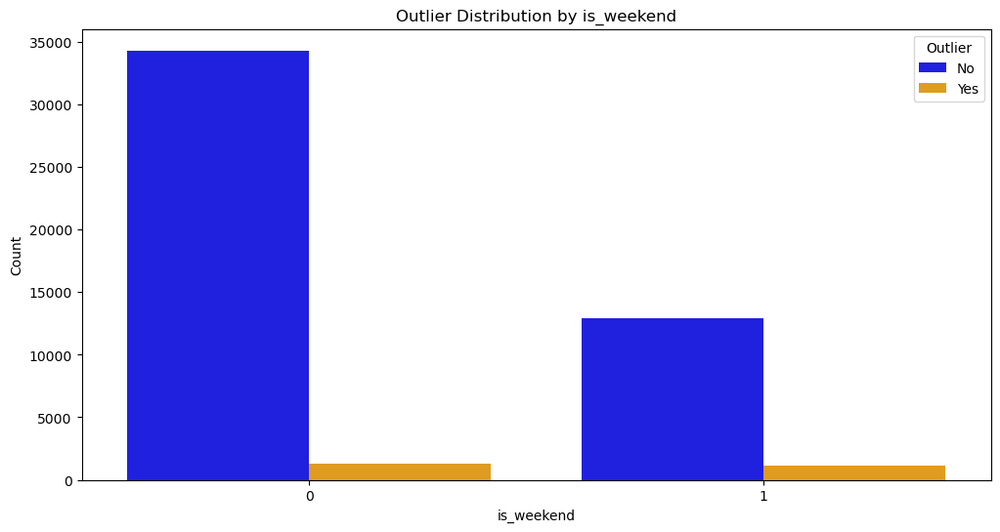

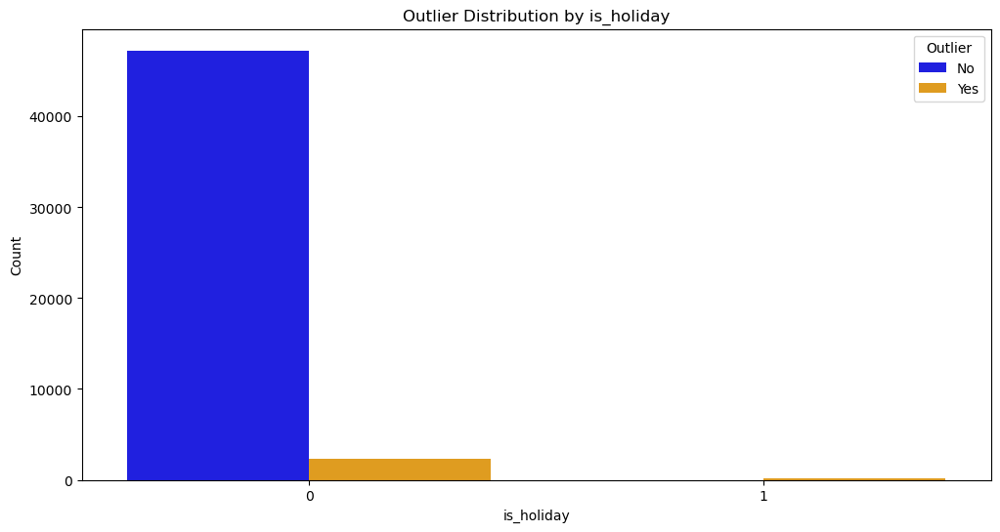

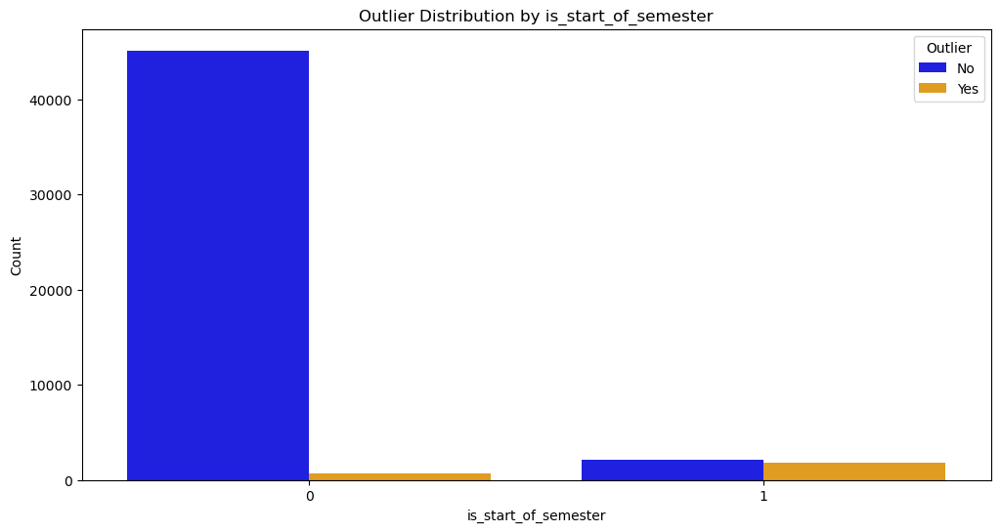

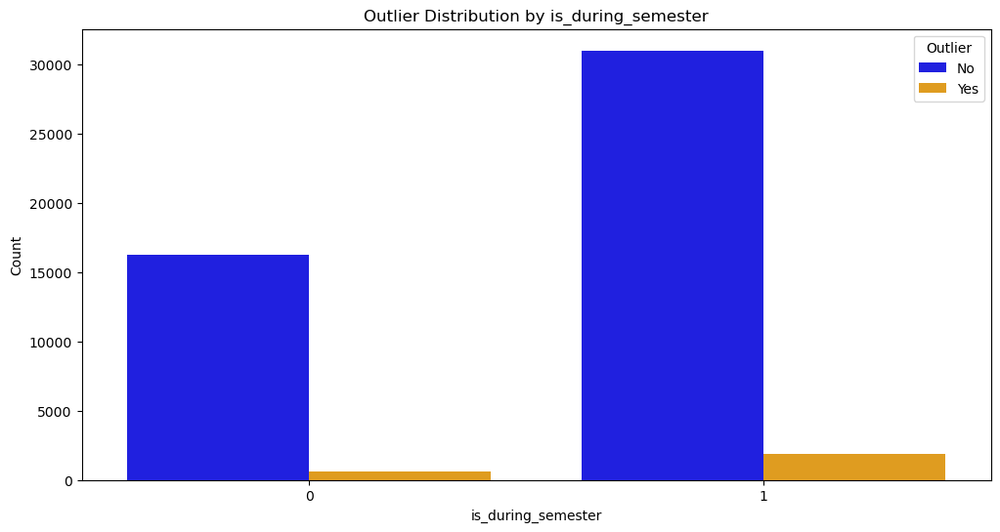

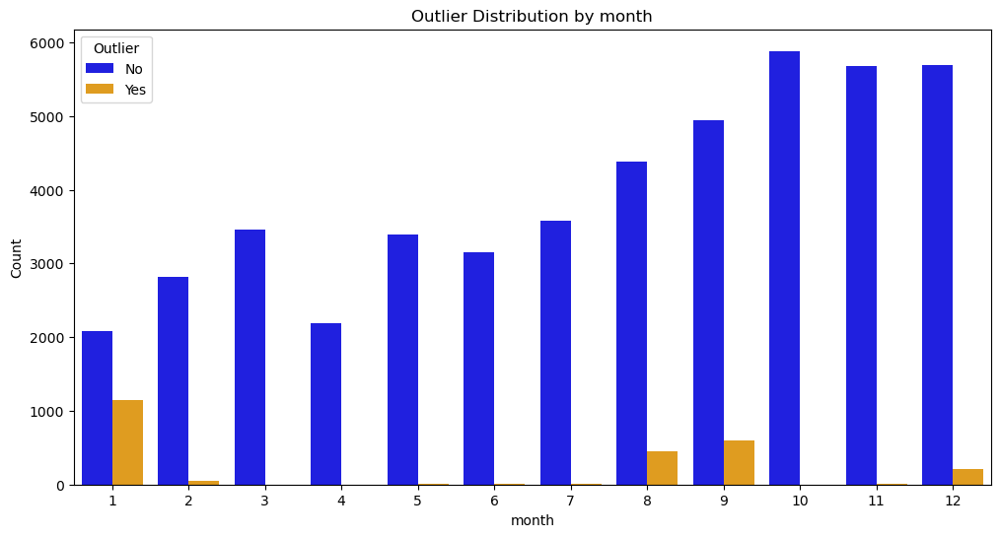

In [68]:
# visualizing outliers in categorical variables
def categorical_outlier_viz(col_name):
    plt.figure(figsize = (12, 6))
    sns.countplot(data=outlier_data, x=col_name, hue="Outlier", palette=["blue", "orange"])
    plt.title(f"Outlier Distribution by {col_name}")
    plt.xlabel(col_name)
    plt.ylabel("Count")
    plt.show()

for o in outlier_data:
    if (outlier_data[o].dtype == "category"):
        categorical_outlier_viz(o)

We observe that a significant proportion of the occurrences labeled as "True" for the categorical feature is_start_of_semester are marked as outliers. This could be due to its rarity in the dataset, which aligns with the anomaly detection model's tendency to flag rare categories as potential outliers. Similarly, we notice that many data points associated with the month of January are marked as outliers, possibly indicating unusual patterns in the dataset during this period.

For numerical features, the outlier visualization aligns with expectations, as most flagged outliers are located at the edges or corners of the distribution, where data points may deviate significantly from the central patterns. This suggests that the anomaly detection model is effectively isolating data points that lie far from the core clusters.

In [77]:
X_train.loc[(X_train["anomaly"] == -1), :]

,timestamp,day_of_week,is_weekend,is_holiday,temperature,is_start_of_semester,is_during_semester,month,hour,minute,progression_into_month,anomoly_scores,anomaly
13734,61216,5,1,0,49.00,0,0,1,17,0,2,-0.004777,-1
59126,6072,6,1,0,48.00,0,0,1,1,41,1,-0.041771,-1
1448,82212,4,0,0,65.80,1,1,8,22,50,28,-0.002381,-1
1743,78613,0,0,0,63.51,1,1,8,21,50,31,-0.006080,-1
59149,19895,6,1,0,47.83,0,0,1,5,31,1,-0.020728,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
59150,20497,6,1,0,47.83,0,0,1,5,41,1,-0.029657,-1
41434,4318,4,0,0,61.00,1,1,8,1,11,26,-0.002002,-1
2433,32414,1,0,0,72.62,1,1,9,9,0,8,-0.009383,-1
16023,28820,1,0,0,50.78,1,1,1,8,0,26,-0.019232,-1


Looking at some of the outliers identified above, there don't seem to be any data entry errors which might justify the dropping of these outliers. Therefore, I will retain these data points and only keep the "anomaly_scores" column, in case it improves the model's accuracy.

In [79]:
X_train.drop(columns = ["anomaly"], inplace = True)
X_train.head()

,timestamp,day_of_week,is_weekend,is_holiday,temperature,is_start_of_semester,is_during_semester,month,hour,minute,progression_into_month,anomoly_scores
35235,78443,2,0,0,61.39,0,0,7,21,47,13,0.117613
21476,81615,0,0,0,55.51,0,1,3,22,40,21,0.111587
24103,52817,1,0,0,69.45,0,1,4,14,40,19,0.139305
23300,53418,5,1,0,58.78,0,1,4,14,50,9,0.105377
43598,31850,6,1,0,56.70,0,1,9,8,50,11,0.094924


## Baseline Models

Having split the data, I will now fit my training data to different models to see which baseline model performs the best. I will be using root mean squared error as my evaluation metric as it is penalizes larger errors more heavily.

In [123]:
def eval_dataset_rmse(X, y, model):
    score = cross_val_score(model, X, y, cv = 5, scoring = "neg_root_mean_squared_error")
    return -1*np.mean(score)

def eval_dataset_mae(X, y, model):
    score = cross_val_score(model, X, y, cv = 5, scoring = "neg_mean_absolute_error")
    return -1*np.mean(score)

In [91]:
# Random Forest Regression
rf_model =  RandomForestRegressor(random_state = 42)
print(f"Random Forest Baseline RMSE: {eval_dataset_rmse(X_train, y_train, rf_model)}")

Random Forest Baseline RMSE: 6.949635451174584


In [93]:
# Gradient Boost Regression
gb_model = GradientBoostingRegressor(random_state = 42)
print(f"Gradient Boost Baseline RMSE: {eval_dataset_rmse(X_train, y_train, gb_model)}")

XGBoost Baseline RMSE: 10.903474232839574


In [96]:
# XGBoost
xgb_model = xgb.XGBRegressor(random_state = 42, enable_categorical=True)
print(f"XGB Baseline RMSE: {eval_dataset_rmse(X_train, y_train, xgb_model)}")

XGB Baseline RMSE: 7.1233151978046605


In [127]:
# Linear Regression
lin_model = LinearRegression()
print(f"Linear Regression Baseline RMSE: {eval_dataset_rmse(X_train, y_train, lin_model)}")

Linear Regression Baseline RMSE: 15.403064469290797


In [136]:
# Support Vector Regression
scaler = StandardScaler()
scaled_X_train = scaler.fit_transform(X_train)

y_scaler = StandardScaler()
scaled_y_train = y_scaler.fit_transform(y_train.values.reshape(-1, 1)).ravel()

svm_model = svm.SVR()
print(f"Support Vector Baseline RMSE: {eval_dataset_rmse(scaled_X_train, scaled_y_train, svm_model) * y_scaler.scale_}")

Support Vector Baseline RMSE: [12.24913449]


In [137]:
# Elastic Net Regression
en_model = ElasticNet(random_state = 42)
print(f"Elastic Net Baseline RMSE: {eval_dataset_rmse(scaled_X_train, scaled_y_train, en_model) * y_scaler.scale_}")

Elastic Net Baseline RMSE: [22.17380577]


The outputs above indicate that the random forest and XGBoost models performed best at their baseline levels. Therefore, I will focus on improving these two models from here on.

## Feature Engineering 

In the EDA, I observed that there was a trend where at the start of the term, there were lots of people in the gym, but as the semester progressed, the crowds reduced as the semester neared its end. I identified an interaction between "month" and "is_during_semester" might potentially be useful. Here, I will create a new interaction feature.

It might also be worthwhile to add a column indicating which semester the students are currently in. My research on sources like Quora and Reddit has suggested that most Berkley students don't take summer session courses. One user on Quora mentioned "Campus is very empty" in the summer. Therefore, taking into account the semester the students are in might be useful information in determining whether or not the gym is crowded.


___
Since month is a label encoded column representing a cyclical (not ordinal)relationship, I will first encode it using one-hot encoding before creating the interaction term:

As some of the binary categorical features such as "is_weekend" are encoded using label encoding but don't actually represent any ordinal relationship, it safer to one hot encode these columns. This is especially needed for non-tree algorithms, like ElasticNet and Support Vector to avoid bias.

For the month and weekend categories, the relationship is cyclical rather than ordinal. Therefore, for my chosen models, it is more appropriate to apply one-hot-encoding to them as well.

In [131]:
# Preprocessing for categorical data
categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(handle_unknown='ignore')),
    ('standardize', StandardScaler())
])

# Preprocessing for numerical data
numerical_transformer = Pipeline(steps = [
    ('standardize', StandardScaler())
])

preprocessor = ColumnTransformer(
    transformers = [
        ('num', numerical_transformer, [num for num in X_train.select_dtypes(exclude = ["category"])]),
        ('cat', categorical_transformer, [cat for cat in X_train.select_dtypes(include = ["category"])])
    ]
)

svm_pipeline = Pipeline(steps = [
    ('preprocessor', preprocessor),
    ('model', svm_model)
])

pipeline_svr = Pipeline([
    ('scaler', StandardScaler()),  # Scale X
    ('svr', svm.SVR())             # Support Vector Regression
])

model = TransformedTargetRegressor(
    regressor=pipeline_svr,
    transformer=StandardScaler()  # Scale y
)

# Fit the model
model.fit(X_train, y_train)

print(f"Support Vector Baseline RMSE: {eval_dataset_rmse(X_train, y_train, model)}")
print(f"Support Vector Baseline MAE: {eval_dataset_mae(X_train, y_train, model)}")

KeyboardInterrupt: 

In [73]:
# one hot encoding month:
y_train_log = np.sqrt(y_train)



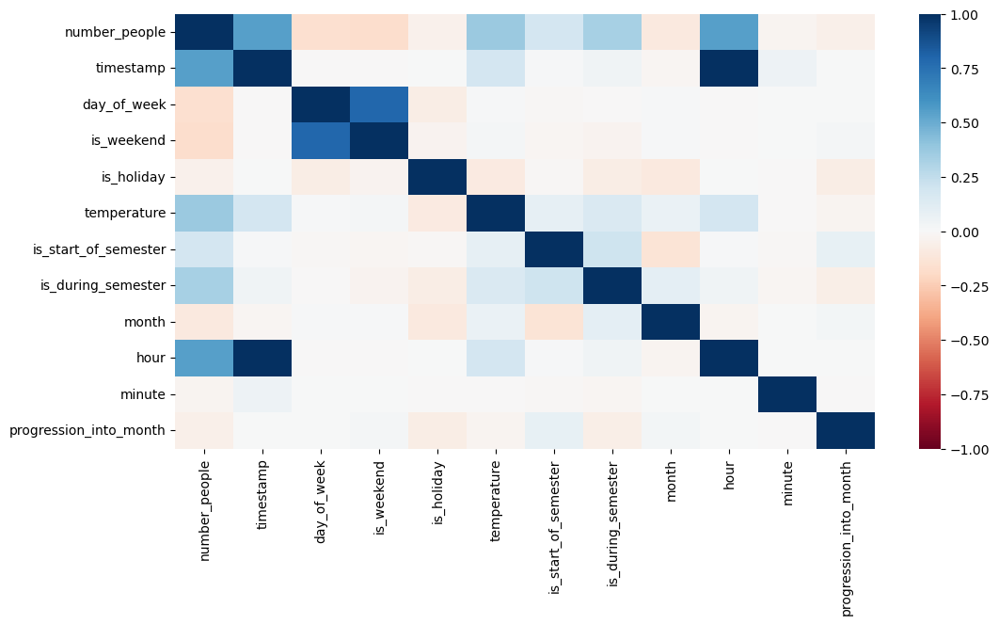

In [74]:
plt.figure(figsize = (12, 6))
corr = df.corr()
sns.heatmap(corr, cmap = "RdBu", vmin = -1, vmax = 1)
plt.show()

The correlation table above shows how strong the **linear relationships** between different variables in the dataset are. The strongest **linear relationships** of "number_people" is with "timestamp" and "hour". The later it is in the day, the more people there are in the gym. The "is_during_semester" and "temperature" features are second most highly correlated with "number_people", suggesting that being in the middle of a semester and a higher temperature are associated with higher crowds in the gym. This aligns with the results of my EDA earlier.

## Hyperparameter Tuning

Previously, I singled out the SVR and Elastic Net regression models as the best baseline performing models. I will now attempt to tune their hyperparameters to improve their performance.

In [132]:
[num for num in X_train.select_dtypes(exclude = ["category"])]

['timestamp',
 'temperature',
 'hour',
 'minute',
 'progression_into_month',
 'anomoly_scores']

In [133]:
[num for num in X_train.select_dtypes(include = ["category"])]

['day_of_week',
 'is_weekend',
 'is_holiday',
 'is_start_of_semester',
 'is_during_semester',
 'month']